# Exploratory Analysis

load necessary modules

In [1]:
from scipy import stats
import numpy as np
import matplotlib.pyplot as plt
import pickle
from histogram_window import histogram_windowing
from itertools import combinations

%matplotlib inline

In [20]:
channel = ('Synap0','Synap1','VGlut10','VGlut11','VGlut2','Vglut3', 'psd','glur2','nmdar1','nr2b','gad','VGAT', 'PV',\
           'Gephyr','GABAR1','GABABR','CR1','5HT1A', 'NOS','TH','VACht','Synapo','tubuli','DAPI') 
channelType = ('ex_pre','ex_pre','ex_pre','ex_pre','ex_pre','in_pre_small', 'ex_post','ex_post','ex_post','ex_post',\
               'in_pre','in_pre', 'in_pre','in_post','in_post','in_post','in_pre_small','other', 'ex_post','other',\
               'other','ex_post','none','none')
channel2type = {channel[i]: channelType[i] for i in range(len(channel))}
type2channels = {chType: [channel[i] for i in range(len(channel)) if channelType[i] == chType] for chType in\
                 set(channelType)}

## Kernel Density Estimates

raw data

In [ ]:
X = np.transpose(np.load('/Users/Tyler/synapse_data/synapse_f0_features.npy'))
mx = np.amax(X)
X_plot = np.linspace(0,int(round(mx)),1000)
channel2pdf = {channel[r]: stats.gaussian_kde(x).evaluate(X_plot) for r,x in enumerate(X)}

plot density estimates with sliding window

In [ ]:
nrows = len(type2channels.keys())
ncols = 1

fig = plt.figure(figsize=(16,12))

for i,chType in enumerate(type2channels.keys()):
    outf = open('./kde_untransformed_' + chType + '_.pkl', 'wb')
    pdfSubset = {key: channel2pdf[key] for key in channel2pdf.keys() if channel2type[key] == chType}
    pickle.dump({"pdfs":pdfSubset,\
                 "xs":X_plot}, outf)
    outf.close()
    
    ax = fig.add_subplot(nrows, ncols, i+1)
    plt.hold(True)
    
    histogram_windowing('./kde_untransformed_' + chType + '_.pkl', 'Synapse' + chType + '(Untransformed)',\
                        'Integrated Brightness', 'Frequency',\
                    (ch for ch in pdfSubset.keys()), color=True)
    

plt.show()

## Pairwise scatter plots for scaled-log-transformed integrated brightness

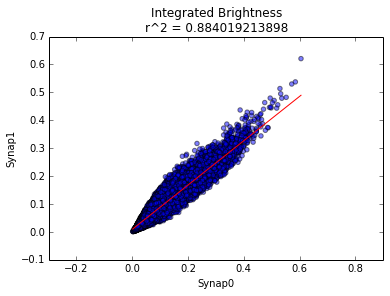

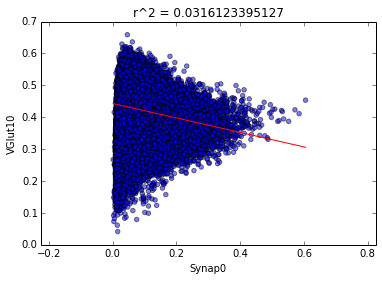

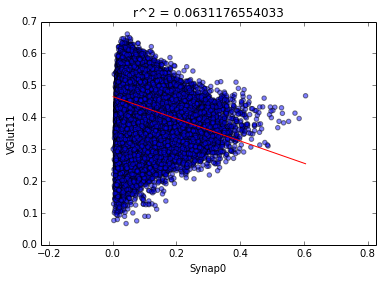

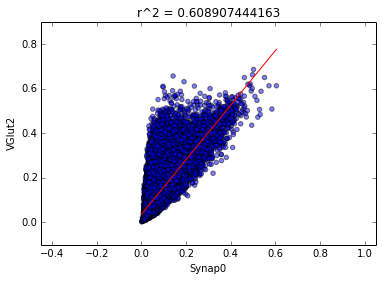

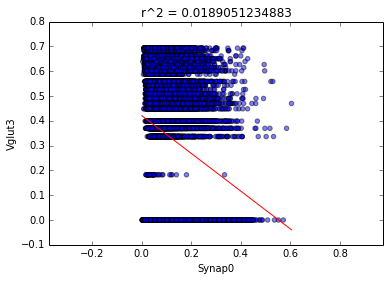

...

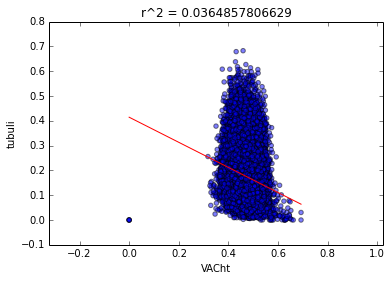

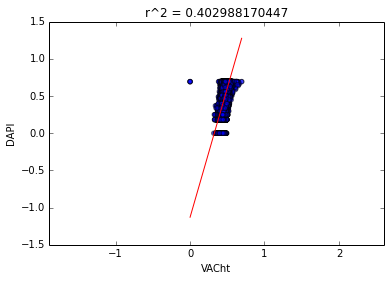

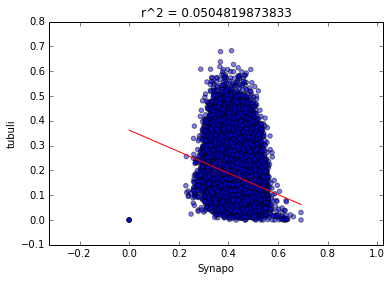

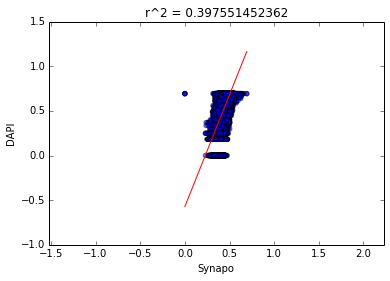

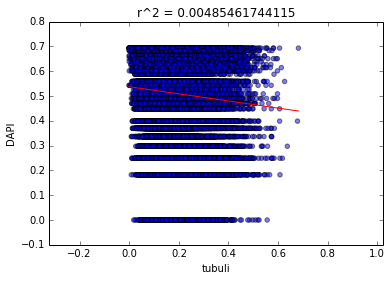

In [46]:
X = np.load('/Users/Tyler/synapse_data/synapse_f0_features_log_normalized.npy')
np.random.seed(1)
np.random.shuffle(X)
X = X[0:int(1e5),:]
n,nchannels = X.shape
c = list(combinations(range(nchannels), 2))
for i, pair in enumerate(c):
    slope, intercept, r_value, p_value, std_err  = stats.linregress(X[:, pair[0]], X[:, pair[1]])
    plt.figure(i)
    plt.scatter(X[:, pair[0]], X[:, pair[1]], hold=True, alpha = 0.5)
    xlow = np.min(X[:, pair[0]])
    xhi = np.max(X[:, pair[0]])
    ylow = slope*xlow + intercept
    yhi = slope*xhi + intercept
    plt.plot([xlow, xhi], [ylow, yhi], color='red')
    plt.axes().set_aspect('equal', 'datalim')
    plt.xlabel(channel[pair[0]])
    plt.ylabel(channel[pair[1]])
    if i == 0:
        plt.title('Integrated Brightness\n' + 'r^2 = ' + str(r_value**2))
    else:
        plt.title('r^2 = ' + str(r_value**2))
    plt.show()